In [878]:
import pandas as pd
import numpy as np
import random
import json
import matplotlib.pyplot as plt
import tweepy
%matplotlib inline
import requests
import os

# Gather Data

## 1. Import Twitter Archive

The WeRateDogs Twitter archive. I am giving this file to you, so imagine it as a file on hand. Download this file manually by clicking the following link: twitter_archive_enhanced.csv

In [393]:
twitter_archive = pd.read_csv('twitter-archive-enhanced.csv')
twitter_archive.head(2)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None


## 2. Import Tweet image predictions


The tweet image predictions, i.e., what breed of dog (or other object, animal, etc.) is present in each tweet according to a neural network. This file (image_predictions.tsv) is hosted on Udacity's servers and should be downloaded programmatically using the Requests library and the following URL: https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv

In [159]:
#downloading and saving the file as image-predictions.tsv
tweet_image_predictions_url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
with open (os.path.join(tweet_image_predictions_url.split('/')[-1]), mode='wb') as file:
        response = requests.get(tweet_image_predictions_url)
        file.write(response.content)

In [160]:
#reading in image prediction (tweet_ip = tweet_imageprediction)
tweet_ip = pd.read_csv('image-predictions.tsv', sep='\t')
tweet_ip.head(2)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True


## 3. Import additional data on from Twitter with Tweepy

Each tweet's retweet count and favorite ("like") count at minimum, and any additional data you find interesting. Using the tweet IDs in the WeRateDogs Twitter archive, query the Twitter API for each tweet's JSON data using Python's Tweepy library and store each tweet's entire set of JSON data in a file called tweet_json.txt file. Each tweet's JSON data should be written to its own line. Then read this .txt file line by line into a pandas DataFrame with (at minimum) tweet ID, retweet count, and favorite count. Note: do not include your Twitter API keys, secrets, and tokens in your project submission.

In [162]:
#https://github.com/kdow/WeRateDogs/blob/master/wrangle_act.ipynb
#Tweepy connection settings
consumer_key = ''
consumer_secret = ''
access_token = ''
access_secret = ''
auth = tweepy.OAuthHandler(access_token, access_secret)

In [163]:
#https://github.com/kdow/WeRateDogs/blob/master/wrangle_act.ipynb
#Connecting with tweepy API
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)
api = tweepy.API(auth, wait_on_rate_limit = True, wait_on_rate_limit_notify = True)

In [164]:
#https://github.com/kdow/WeRateDogs/blob/master/wrangle_act.ipynb
#Create a TXT json file where each ID has its own line and all information is stored in one txt file
#Failures are stored in exeptions for a 2nd try

exeptions = []
with open('tweet_json.txt', 'a', encoding = 'utf8') as f:
       for tweet_id in twitter_archive['tweet_id']:
            try:
                tweet = api.get_status(tweet_id)
                json.dump(tweet._json, f)
                f.write('\n')
            except Exception as e:
                print(str(tweet_id) + str(e))
                exeptions.append(tweet_id)

888202515573088257[{'code': 144, 'message': 'No status found with that ID.'}]
873697596434513921[{'code': 144, 'message': 'No status found with that ID.'}]
872668790621863937[{'code': 34, 'message': 'Sorry, that page does not exist.'}]
869988702071779329[{'code': 144, 'message': 'No status found with that ID.'}]
866816280283807744[{'code': 144, 'message': 'No status found with that ID.'}]
861769973181624320[{'code': 144, 'message': 'No status found with that ID.'}]
845459076796616705[{'code': 144, 'message': 'No status found with that ID.'}]
842892208864923648[{'code': 144, 'message': 'No status found with that ID.'}]
837012587749474308[{'code': 144, 'message': 'No status found with that ID.'}]
827228250799742977[{'code': 144, 'message': 'No status found with that ID.'}]
802247111496568832[{'code': 144, 'message': 'No status found with that ID.'}]
775096608509886464[{'code': 144, 'message': 'No status found with that ID.'}]
771004394259247104[{'code': 179, 'message': 'Sorry, you are no

754011816964026368[{'code': 144, 'message': 'No status found with that ID.'}]


In [173]:
#2nd attemp to retrieve data
with open('tweet_json.txt', 'a', encoding = 'utf8') as f:
    for exeption in exeptions:
        try:
            tweet = api.get_status(exeption)
            json.dump(tweet._json, f)
            f.write('\n')
        except:
                print(str(exeption) + ' could not be added in second attemp')

888202515573088257 could not be added in second attemp
873697596434513921 could not be added in second attemp
872668790621863937 could not be added in second attemp
869988702071779329 could not be added in second attemp
866816280283807744 could not be added in second attemp
861769973181624320 could not be added in second attemp
845459076796616705 could not be added in second attemp
842892208864923648 could not be added in second attemp
837012587749474308 could not be added in second attemp
827228250799742977 could not be added in second attemp
802247111496568832 could not be added in second attemp
775096608509886464 could not be added in second attemp
771004394259247104 could not be added in second attemp
770743923962707968 could not be added in second attemp
754011816964026368 could not be added in second attemp


In [210]:
#Reading json file and appending it to a list (dictionary)
tweets_data = []

with open('tweet_json.txt', "r") as json_file:
    for line in json_file:
        try:
            tweet = json.loads(line)
            tweets_data.append(tweet)
        except:
            continue



[{'created_at': 'Tue Aug 01 16:23:56 +0000 2017',
  'id': 892420643555336193,
  'id_str': '892420643555336193',
  'text': "This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU",
  'truncated': False,
  'entities': {'hashtags': [],
   'symbols': [],
   'user_mentions': [],
   'urls': [],
   'media': [{'id': 892420639486877696,
     'id_str': '892420639486877696',
     'indices': [86, 109],
     'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg',
     'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg',
     'url': 'https://t.co/MgUWQ76dJU',
     'display_url': 'pic.twitter.com/MgUWQ76dJU',
     'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1',
     'type': 'photo',
     'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'},
      'medium': {'w': 540, 'h': 528, 'resize': 'fit'},
      'small': {'w': 540, 'h': 528, 'resize': 'fit'},
      'large': {'w': 540, 'h': 528, 

In [211]:
#Creating a dataframe based on dictionary and dropping unneeded columns in dataframe
#Sorting columns of DF in desired order
        
tweets_data = pd.DataFrame(tweets_data)
 
keep_columns = ['id', 'retweet_count', 'favorite_count', 'created_at', 'text', 'source']
drop_columns = []

for column in list(test):
    if column not in keep_columns:
        drop_columns.append(column)
        
tweets_data = tweets_data.drop(columns  = drop_columns, axis=1)
tweets_data = tweets_data.reindex(keep_columns, axis = 1)



In [212]:
tweets_data = pd.DataFrame(tweets_data)

In [213]:
tweets_data.head(2)

,id,retweet_count,favorite_count,created_at,text,source
0,892420643555336193,8439,38420,Tue Aug 01 16:23:56 +0000 2017,This is Phineas. He's a mystical boy. Only eve...,"<a href=""http://twitter.com/download/iphone"" r..."
1,892177421306343426,6221,32901,Tue Aug 01 00:17:27 +0000 2017,This is Tilly. She's just checking pup on you....,"<a href=""http://twitter.com/download/iphone"" r..."


In [214]:
tweets_data.to_csv('tweets_data.csv')

# Assess

## Visual Assesment



**All the files were opened in a text editor program to visually assess the data. Thereby, the following issues were noticed.


### File: twitter_archive

**Quality:**

- Some tweet_ids contain links instead of numbers
- Some sources contain multiple links
- Some Text is missing
- Retweeted columns seem to miss a lot of values
- Some expanded URLs have multiple entries (the same link was repeated several times)
- Some rating numerators and denominators are missing
- Some names are missing
- Little information about doggo, floofer, pupper, puppo is available

### File: tweets_data 

**Quality:**

- There is a column with index numbers
- Missing information of twitter_archive is not part of the the data set


### File: image_predictions 

- There were no issues identified in the data set

## Programmic Assesment

In [185]:
#Check teh shape of tweets_data set
tweets_data.shape

(2341, 4)

In [178]:
#Check teh shape of twitter_archive set
twitter_archive.shape

(2356, 17)

In [183]:
#Check teh shape of tweet_ip set
tweet_ip.shape

(2075, 12)

In [262]:
#check if there are any duplicates
sum(tweets_data.duplicated()), sum(twitter_archive.duplicated()), sum(tweet_ip.duplicated())

(0, 0, 0)

In [264]:
#Missing values in tweets_data correspond exactly to length of exeptions
tweets_data.shape[0] - twitter_archive.shape[0]
len(exeptions)
tweets_data.query('id == @exeptions')

,id,retweet_count,favorite_count,created_at,text,source


In [268]:
#checking some samples of tweets_data
tweets_data.sample(5)

,id,retweet_count,favorite_count,created_at,text,source
1448,694669722378485760,15614,37826,Tue Feb 02 23:52:22 +0000 2016,This is Phil. He's an important dog. Can contr...,"<a href=""http://twitter.com/download/iphone"" r..."
1976,672622327801233409,516,1323,Fri Dec 04 03:43:54 +0000 2015,This lil pupper is sad because we haven't foun...,"<a href=""http://twitter.com/download/iphone"" r..."
959,750056684286914561,973,3341,Mon Jul 04 20:00:23 +0000 2016,This is Jameson. He had a few too many in the ...,"<a href=""https://about.twitter.com/products/tw..."
1944,673576835670777856,586,1421,Sun Dec 06 18:56:46 +0000 2015,Sun burnt dog here. Quite large. Wants to prom...,"<a href=""http://twitter.com/download/iphone"" r..."
343,831315979191906304,1218,6935,Tue Feb 14 01:35:49 +0000 2017,I couldn't make it to the #WKCDogShow BUT I ha...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw..."


In [881]:
#checking some samples of twitter_archive
twitter_archive.sample(5)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
2136,670055038660800512,NaN,NaN,2015-11-27 01:42:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Tommy. He's a cool dog. Hard not to step on. Won't let go of seashell. Not fast by any means. 3/10 https://t.co/0gY6XTOpn3,NaN,NaN,NaN,https://twitter.com/dog_rates/status/670055038660800512/photo/1,3,10,Tommy,None,None,None,None
1055,742385895052087300,NaN,NaN,2016-06-13 15:59:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phil. That's his comfort stick. He holds onto it whenever he's sad. 11/10 don't be sad Phil https://t.co/ULdPY6CLpq,NaN,NaN,NaN,https://twitter.com/dog_rates/status/742385895052087300/photo/1,11,10,Phil,None,None,None,None
132,866816280283807744,NaN,NaN,2017-05-23 00:41:20 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","RT @dog_rates: This is Jamesy. He gives a kiss to every other pupper he sees on his walk. 13/10 such passion, much tender https://t.co/wk7T…",8.664507e+17,4.196984e+09,2017-05-22 00:28:40 +0000,"https://twitter.com/dog_rates/status/866450705531457537/photo/1,https://twitter.com/dog_rates/status/866450705531457537/photo/1",13,10,Jamesy,None,None,pupper,None
811,771171053431250945,NaN,NaN,2016-09-01 02:21:21 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",RT @dog_rates: This is Frankie. He's wearing blush. 11/10 really accents the cheek bones https://t.co/iJABMhVidf,6.733201e+17,4.196984e+09,2015-12-06 01:56:44 +0000,"https://twitter.com/dog_rates/status/673320132811366400/photo/1,https://twitter.com/dog_rates/status/673320132811366400/photo/1,https://twitter.com/dog_rates/status/673320132811366400/photo/1,https://twitter.com/dog_rates/status/673320132811366400/photo/1,https://twitter.com/dog_rates/status/673320132811366400/photo/1,https://twitter.com/dog_rates/status/673320132811366400/photo/1,https://twitter.com/dog_rates/status/673320132811366400/photo/1,https://twitter.com/dog_rates/status/673320132811366400/photo/1",11,10,Frankie,None,None,None,None
1756,678767140346941444,NaN,NaN,2015-12-21 02:41:11 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Mia. She makes awful decisions. 8/10 https://t.co/G6TQVgTcZz,NaN,NaN,NaN,https://twitter.com/dog_rates/status/678767140346941444/photo/1,8,10,Mia,None,None,None,None


In [270]:
#checking some samples of tweet_ip
tweet_ip.sample(5)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
1930,858843525470990336,https://pbs.twimg.com/media/C-s5oYZXkAAMHHq.jpg,1,golden_retriever,0.578120,True,Labrador_retriever,0.286059,True,bloodhound,0.026917,True
1162,734912297295085568,https://pbs.twimg.com/media/CjLuzPvUoAAbU5k.jpg,1,Maltese_dog,0.847292,True,feather_boa,0.059379,False,Old_English_sheepdog,0.052758,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
1199,740711788199743490,https://pbs.twimg.com/media/CkeJcNkXEAAcrks.jpg,1,toy_poodle,0.388277,True,Angora,0.180264,False,Persian_cat,0.049656,False
434,674372068062928900,https://pbs.twimg.com/media/CVvZ0KTWwAAdXKV.jpg,1,seashore,0.346126,False,American_alligator,0.106404,False,sandbar,0.049349,False


In [273]:
#Tweets_data info about data set
tweets_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2341 entries, 0 to 2340
Data columns (total 6 columns):
id                2341 non-null int64
retweet_count     2341 non-null int64
favorite_count    2341 non-null int64
created_at        2341 non-null object
text              2341 non-null object
source            2341 non-null object
dtypes: int64(3), object(3)
memory usage: 109.8+ KB


In [307]:
#Have a deeper look in data set
def get_type(data_set):
    for item in list(data_set):
        print(str(item), str(type(data_set[item][0])))

get_type(tweets_data)

id <class 'numpy.int64'>
retweet_count <class 'numpy.int64'>
favorite_count <class 'numpy.int64'>
created_at <class 'str'>
text <class 'str'>
source <class 'str'>


In [274]:
#twitter_archive info about data set
twitter_archive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null object
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: float64(4), int64(3), ob

In [310]:
#Have a deeper look in data set
get_type(twitter_archive)

tweet_id <class 'numpy.int64'>
in_reply_to_status_id <class 'numpy.float64'>
in_reply_to_user_id <class 'numpy.float64'>
timestamp <class 'str'>
source <class 'str'>
text <class 'str'>
retweeted_status_id <class 'numpy.float64'>
retweeted_status_user_id <class 'numpy.float64'>
retweeted_status_timestamp <class 'float'>
expanded_urls <class 'str'>
rating_numerator <class 'numpy.int64'>
rating_denominator <class 'numpy.int64'>
name <class 'str'>
doggo <class 'str'>
floofer <class 'str'>
pupper <class 'str'>
puppo <class 'str'>


In [275]:
#tweet_ip info about data set
tweet_ip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
img_num     2075 non-null int64
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [312]:
#Have a deeper look in data set
get_type(tweet_ip)

tweet_id <class 'numpy.int64'>
jpg_url <class 'str'>
img_num <class 'numpy.int64'>
p1 <class 'str'>
p1_conf <class 'numpy.float64'>
p1_dog <class 'numpy.bool_'>
p2 <class 'str'>
p2_conf <class 'numpy.float64'>
p2_dog <class 'numpy.bool_'>
p3 <class 'str'>
p3_conf <class 'numpy.float64'>
p3_dog <class 'numpy.bool_'>


In [276]:
#tweets_data basic statistics
tweets_data.describe()

,id,retweet_count,favorite_count
count,2.341000e+03,2341.000000,2341.000000
mean,7.422089e+17,2971.941478,8028.603588
std,6.833609e+16,4979.200988,12359.240655
min,6.660209e+17,0.000000,0.000000
25%,6.783411e+17,598.000000,1391.000000
50%,7.186133e+17,1392.000000,3506.000000
75%,7.986979e+17,3469.000000,9865.000000
max,8.924206e+17,84538.000000,164794.000000


In [279]:
#twitter_archive basic statistics
twitter_archive.describe()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_numerator,rating_denominator
count,2.356000e+03,7.800000e+01,7.800000e+01,1.810000e+02,1.810000e+02,2356.000000,2356.000000
mean,7.427716e+17,7.455079e+17,2.014171e+16,7.720400e+17,1.241698e+16,13.126486,10.455433
std,6.856705e+16,7.582492e+16,1.252797e+17,6.236928e+16,9.599254e+16,45.876648,6.745237
min,6.660209e+17,6.658147e+17,1.185634e+07,6.661041e+17,7.832140e+05,0.000000,0.000000
25%,6.783989e+17,6.757419e+17,3.086374e+08,7.186315e+17,4.196984e+09,10.000000,10.000000
50%,7.196279e+17,7.038708e+17,4.196984e+09,7.804657e+17,4.196984e+09,11.000000,10.000000
75%,7.993373e+17,8.257804e+17,4.196984e+09,8.203146e+17,4.196984e+09,12.000000,10.000000
max,8.924206e+17,8.862664e+17,8.405479e+17,8.874740e+17,7.874618e+17,1776.000000,170.000000


In [331]:
#rating_numerator and rating_denominator seem to have very high scores, let's have a deeper look
twitter_archive.query('rating_denominator == rating_denominator.max() | rating_numerator == rating_numerator.max()')

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
979,749981277374128128,NaN,NaN,2016-07-04 15:00:45 +0000,"<a href=""https://about.twitter.com/products/tw...",This is Atticus. He's quite simply America af....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/749981277...,1776,10,Atticus,None,None,None,None
1120,731156023742988288,NaN,NaN,2016-05-13 16:15:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Say hello to this unbelievably well behaved sq...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/731156023...,204,170,this,None,None,None,None


In [337]:
#URL of rating_numerator and rating_denominator with highest scores
twitter_archive.query('rating_denominator == rating_denominator.max() | rating_numerator == rating_numerator.max()').expanded_urls

#url does not work

979     https://twitter.com/dog_rates/status/749981277...
1120    https://twitter.com/dog_rates/status/731156023...
Name: expanded_urls, dtype: object

In [338]:
#searching id for manuel search of tweet post
twitter_archive.query('rating_denominator == rating_denominator.max() | rating_numerator == rating_numerator.max()').tweet_id

979     749981277374128128
1120    731156023742988288
Name: tweet_id, dtype: int64

In [887]:
#check out the names of dogs
twitter_archive['name'].value_counts()

None       745
a          55 
Charlie    12 
Cooper     11 
Lucy       11 
Oliver     11 
Lola       10 
Tucker     10 
Penny      10 
Winston    9  
Bo         9  
Sadie      8  
the        8  
Bailey     7  
Daisy      7  
Buddy      7  
an         7  
Toby       7  
Koda       6  
Jack       6  
Jax        6  
Dave       6  
Stanley    6  
Bella      6  
Leo        6  
Rusty      6  
Oscar      6  
Scout      6  
Milo       6  
Alfie      5  
          ..  
Newt       1  
Ginger     1  
Bobb       1  
Buddah     1  
Oddie      1  
Pete       1  
Iggy       1  
Cannon     1  
Monster    1  
Tobi       1  
Chloe      1  
Clyde      1  
Swagger    1  
Shiloh     1  
Ralphé     1  
Lolo       1  
Tupawc     1  
Chaz       1  
Edmund     1  
Skye       1  
Godi       1  
Tayzie     1  
Champ      1  
Herb       1  
Remy       1  
Pubert     1  
Ron        1  
Grizzie    1  
Vince      1  
Baron      1  
Name: name, Length: 957, dtype: int64

In [343]:
#tweet_ip basic statistics
tweet_ip.describe()

,tweet_id,img_num,p1_conf,p2_conf,p3_conf
count,2.075000e+03,2075.000000,2075.000000,2.075000e+03,2.075000e+03
mean,7.384514e+17,1.203855,0.594548,1.345886e-01,6.032417e-02
std,6.785203e+16,0.561875,0.271174,1.006657e-01,5.090593e-02
min,6.660209e+17,1.000000,0.044333,1.011300e-08,1.740170e-10
25%,6.764835e+17,1.000000,0.364412,5.388625e-02,1.622240e-02
50%,7.119988e+17,1.000000,0.588230,1.181810e-01,4.944380e-02
75%,7.932034e+17,1.000000,0.843855,1.955655e-01,9.180755e-02
max,8.924206e+17,4.000000,1.000000,4.880140e-01,2.734190e-01


In [271]:
tweets_data['text'].sample(5)

937     This is Ruby. Her ice cube is melting. She doe...
984     Stop what you're doing and watch this heckin m...
1833    This is Bernie. He just touched a boob for the...
283     @bragg6of8 @Andy_Pace_ we are still looking fo...
207     Oh jeez u did me quite the spook little fella....
Name: text, dtype: object

In [272]:
twitter_archive['text'].sample(5)

809     This is Dakota. He's just saying hi. That's al...
592     This is Iroh. He's in a predicament. 12/10 som...
95      RT @dog_rates: This is Walter. He won't start ...
1277    This is Klevin. He's addicted to sandwiches (y...
909     This is Beckham. He fell asleep at the wheel. ...
Name: text, dtype: object

### All files 
**Quality:**

- `Tweets_archive` show more rows than `tweets_data` (15 in total), which is the exact amount of exeptions
- `Tweet_ip` has  significant lower amount of rows: 2075 in total
- Ids in exeption not part of `tweets_data`
- `tweets_data` id should be string and not an integer
- `tweets_data` created_at should be pd.date_time format instead of string
- `twitter_archive` tweet_id should be string and not an integer
- Texts in both datasets `twitter_archive` and `tweets_data` are not in full length
- There is a really high numerator and denumerator in `twitter_archive`
- Exanded_urls in `twitter_archive` do not work
- `twitter_archive` in_reply_to_status_id and in_reply_to_user_id contain only 78 non-null values
- `twitter_archive` contain only 181 non-null values of retweeted_status_id, retweeted_status_user_id and retweeted_status_timestamp 



#### tidiness

- One single column for"stages od dog" (doggo floofer pupper puppo) in `twitter_archive`
- All files should be joined to one "Master file"

## Summary Assessing

### Visual assesment
**Quality:**

- Some tweet_ids contain links instead of numbers
- Some sources contain multiple links and are hardly readable
- Some Text is missing
- Retweeted columns seem to miss a lot of values
- Some expanded URLs have multiple entries (the same link was repeated several times)
- Some rating numerators and denominators are missing
- Some names are missing
- Little information about doggo, floofer, pupper, puppo is available
- Missing information of twitter_id_enhanced is not part of the data set
- There were no issues identifliied in the image data set

### Programmatic Asssesment 
**Quality:**

- `Tweets_archive` show more rows than `tweets_data` (15 in total), which is the exact amount of exeptions
- `Tweet_ip` has  significant lower amount of rows: 2075 in total
- Ids in exeption not part of `tweets_data`
- `tweets_data` id should be string and not an integer
- `tweets_data` created_at should be pd.date_time format instead of string
- `twitter_archive` tweet_id should be string and not an integer
- Texts in both datasets `twitter_archive` and `tweets_data` are not in full length
- There is a really high numerator and denumerator in `twitter_archive`
- Exanded_urls in `twitter_archive` do not work
- `twitter_archive` in_reply_to_status_id and in_reply_to_user_id contain only 78 non-null values
- `twitter_archive` contain only 181 non-null values of retweeted_status_id, retweeted_status_user_id and retweeted_status_timestamp 

**tidiness**

- One single column for"stages od dog" (doggo floofer pupper puppo) in `twitter_archive`
- All files should be joined to one "Master file"



# Regather data 

**Define**: There are several quality issues that will be targeret with this step. Regathering the data, with en extended mode would benefit as it would contribute to the following points indirectly:

**Quality:**

- Some Text is missing
- Retweeted columns seem to miss a lot of values
- Some expanded URLs have multiple entries (the same link was repeated several times)
- Some rating numerators and denominators are missing
- Little information about doggo, floofer, pupper, puppo is available
- Missing information of twitter_id_enhanced is not part of the data set
- Ids in exeption not part of `tweets_data`
- Texts in both datasets `twitter_archive` and `tweets_data` are not in full length
- Exanded_urls in `twitter_archive` do not work
- One single column for"stages of dog" (doggo floofer pupper puppo) in `tweets_data`




**Code**

In [355]:
#https://github.com/tweepy/tweepy/issues/935
#regather data, this time extended tweet_mode
with open('tweet_json2.txt', 'a', encoding = 'utf8') as f:
       for tweet_id in twitter_archive['tweet_id']:
            try:
                tweet = api.get_status(tweet_id, tweet_mode='extended')
                json.dump(tweet._json, f)
                f.write('\n')
            except Exception as e:
                print(str(tweet_id) + str(e))

888202515573088257[{'code': 144, 'message': 'No status found with that ID.'}]
873697596434513921[{'code': 144, 'message': 'No status found with that ID.'}]
872668790621863937[{'code': 34, 'message': 'Sorry, that page does not exist.'}]
869988702071779329[{'code': 144, 'message': 'No status found with that ID.'}]
866816280283807744[{'code': 144, 'message': 'No status found with that ID.'}]
861769973181624320[{'code': 144, 'message': 'No status found with that ID.'}]
845459076796616705[{'code': 144, 'message': 'No status found with that ID.'}]
842892208864923648[{'code': 144, 'message': 'No status found with that ID.'}]
837012587749474308[{'code': 144, 'message': 'No status found with that ID.'}]
827228250799742977[{'code': 144, 'message': 'No status found with that ID.'}]
802247111496568832[{'code': 144, 'message': 'No status found with that ID.'}]


775096608509886464[{'code': 144, 'message': 'No status found with that ID.'}]
771004394259247104[{'code': 179, 'message': 'Sorry, you are not authorized to see this status.'}]
770743923962707968[{'code': 144, 'message': 'No status found with that ID.'}]
754011816964026368[{'code': 144, 'message': 'No status found with that ID.'}]


In [432]:
#create a list of json objects for each line
tweets_data_2 = []

with open('tweet_json2.txt', "r") as json_file:
    for line in json_file:
        try:
            tweet = json.loads(line)
            tweets_data_2.append(tweet)
        except:
            continue

tweets_data_2

[{'created_at': 'Tue Aug 01 16:23:56 +0000 2017',
  'id': 892420643555336193,
  'id_str': '892420643555336193',
  'full_text': "This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU",
  'truncated': False,
  'display_text_range': [0, 85],
  'entities': {'hashtags': [],
   'symbols': [],
   'user_mentions': [],
   'urls': [],
   'media': [{'id': 892420639486877696,
     'id_str': '892420639486877696',
     'indices': [86, 109],
     'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg',
     'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg',
     'url': 'https://t.co/MgUWQ76dJU',
     'display_url': 'pic.twitter.com/MgUWQ76dJU',
     'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1',
     'type': 'photo',
     'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'},
      'medium': {'w': 540, 'h': 528, 'resize': 'fit'},
      'small': {'w': 540, 'h': 528, 'resize': 'fit'}

In [1607]:
#create new DataFrame
tweets_data_2 = pd.DataFrame(tweets_data_2)
tweets_data_2.shape
tweets_data_2.to_csv('tweets_data_2.csv')

**Test**

In [1608]:
tweets_data_2.head(2)

,contributors,coordinates,created_at,display_text_range,entities,extended_entities,favorite_count,favorited,full_text,geo,...,quoted_status_id,quoted_status_id_str,quoted_status_permalink,retweet_count,retweeted,retweeted_status,source,truncated,user,expanded_url
0,None,None,Tue Aug 01 16:23:56 +0000 2017,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'pic.twitter.com/MgUWQ76dJU', 'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 540, 'h': 528, 'resize': 'fit'}, 'small': {'w': 540, 'h': 528, 'resize': 'fit'}, 'large': {'w': 540, 'h': 528, 'resize': 'fit'}}}]}","{'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'pic.twitter.com/MgUWQ76dJU', 'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 540, 'h': 528, 'resize': 'fit'}, 'small': {'w': 540, 'h': 528, 'resize': 'fit'}, 'large': {'w': 540, 'h': 528, 'resize': 'fit'}}}]}",38399,False,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,None,...,NaN,NaN,NaN,8435,False,NaN,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",False,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™', 'screen_name': 'dog_rates', 'location': '⇩ merch ⇩ DM YOUR DOGS', 'description': 'Your Only Source For Professional Dog Ratings ⠀ ⠀IG, FB, Snapchat ⇨ WeRateDogs ⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀ Business: dogratingtwitter@gmail.com', 'url': 'https://t.co/N7sNNHAEXS', 'entities': {'url': {'urls': [{'url': 'https://t.co/N7sNNHAEXS', 'expanded_url': 'http://weratedogs.com', 'display_url': 'weratedogs.com', 'indices': [0, 23]}]}, 'description': {'urls': []}}, 'protected': False, 'followers_count': 7264628, 'friends_count': 10, 'listed_count': 5125, 'created_at': 'Sun Nov 15 21:41:29 +0000 2015', 'favourites_count': 138182, 'utc_offset': None, 'time_zone': None, 'geo_enabled': True, 'verified': True, 'statuses_count': 8881, 'lang': 'en', 'contributors_enabled': False, 'is_translator': False, 'is_translation_enabled': False, 'profile_background_color': '000000', 'profile_background_image_url': 'http://abs.twimg.com/images/themes/theme1/bg.png', 'profile_background_image_url_https': 'https://abs.twimg.com/images/themes/theme1/bg.png', 'profile_background_tile': False, 'profile_image_url': 'http://pbs.twimg.com/profile_images/948761950363664385/Fpr2Oz35_normal.jpg', 'profile_image_url_https': 'https://pbs.twimg.com/profile_images/948761950363664385/Fpr2Oz35_normal.jpg', 'profile_banner_url': 'https://pbs.twimg.com/profile_banners/4196983835/1525830435', 'profile_link_color': 'F5ABB5', 'profile_sidebar_border_color': '000000', 'profile_sidebar_fill_color': '000000', 'profile_text_color': '000000', 'profile_use_background_image': False, 'has_extended_profile': False, 'default_profile': False, 'default_profile_image': False, 'following': False, 'follow_request_sent': False, 'notifications': False, 'translator_type': 'none'}",http://twitter.com/dog_rates/status/892420643555336193/photo/1
1,None,None,Tue Aug 01 00:17:27 +0000 2017,"[0, 138]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892177413194625024, 'id_str': '892177413194625024', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg', 'media_url_h

## Wrangle Data

In [1609]:
#Create copy of each data_set
tweet_data = tweets_data_2.copy()
tweet_archive = twitter_archive.copy()
tweet_image = tweet_ip.copy()

**Define**: Extract correct  expanded urls from tweets_data_2.extended_entities column

**Code**

In [1610]:
#create the link needed and those keeps NAN values if available
correct_expanded_links = []
for i in range(len(tweet_data['extended_entities'])):
    try:
        get_link = 'http:'+str(tweet_data['extended_entities'][i]['media']).split(':')[12][:-9]
        correct_expanded_links.append(get_link)
    except:
        no_link = tweet_data['extended_entities'][i]
        correct_expanded_links.append(no_link)


tweet_data['expanded_url'] = correct_expanded_links


**Test**

In [1611]:
#print randomly chossen links
print(tweet_data['expanded_url'][10],
tweet_data['expanded_url'][122],
tweet_data['expanded_url'][822],
tweet_data['expanded_url'][1200],
tweet_data['expanded_url'][1822])

http://twitter.com/dog_rates/status/890006608113172480/photo/1 http://twitter.com/dog_rates/status/868552278524837888/photo/1 http://twitter.com/dog_rates/status/767884188863397888/photo/1 http://twitter.com/dog_rates/status/715009755312439296/photo/1 http://twitter.com/dog_rates/status/676089483918516224/photo/1


**Define:** Extract information from text in tweets_data and store it in a new column called stage_of_dog

**Code**

In [1612]:
tweet_data['stage_of_dog'] = tweet_data['full_text'].str.extract('(puppo|pupper|floofer|doggo|blep|Puppo|Pupper|Floofer|Doggo|Blep)')

**Test**

In [1613]:
tweet_data['full_text'][9], tweet_data['full_text'][28]

('This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A',
 'This is Roscoe. Another pupper fallen victim to spontaneous tongue ejections. Get the BlepiPen immediate. 12/10 deep breaths Roscoe https://t.co/RGE08MIJox')

In [1614]:
tweet_data['stage_of_dog'][9], tweet_data['stage_of_dog'][28]

('doggo', 'pupper')

In [1615]:
tweet_data['stage_of_dog'] = tweet_data['stage_of_dog'].str.lower()
tweet_data['stage_of_dog'].value_counts()

pupper     270
doggo      98 
puppo      38 
floofer    9  
blep       3  
Name: stage_of_dog, dtype: int64

In [1616]:
print('Tottaly', sum(tweet_data['stage_of_dog'].notnull()), 'stages of dogs were identified.')

Tottaly 418 stages of dogs were identified.


**Define** : Extract ratings in tweet_data to new columns numerator and denominator



**Code**

In [1617]:
numerator = []
denominator = []

for i in range(len(tweet_data['full_text'])):
    num = tweet_data['full_text'][i].split('/')[0][-2:]
    den = tweet_data['full_text'][i].split('/')[1][:2]
    numerator.append(num)
    denominator.append(den)

tweet_data['denominator'] = denominator
tweet_data['numerator'] = numerator

#correct some incorrect value in numerator column
to_repl = ['.8', '(8', '\n5', '43', 'ry', ';2', 'st', ' w', '\n9', '.9']
repl_with = ['8', '8', '5', '143', '11', '2', '12', '3', '9', '9']
tweet_data['numerator'].replace(to_repl, repl_with, inplace=True) 
tweet_data['numerator'][44].replace('.5', '13.5')
tweet_data['numerator'][1674].replace('.5', '9.5')
tweet_data['numerator'][304].replace('60', '13')
tweet_data['numerator'][2320].replace('1', '9')
tweet_data['numerator'][1105].replace('4', '204')
tweet_data['numerator'][1105].replace('24', 'None')

tweet_data['numerator'] = tweet_data['numerator'].astype(float)

#correct some more incorrect values in denominator and numerator column
#ou in 10
#00 in 10 (row 304 -> num 96 in 13)
#2 in 10 (row 2320 -> num 1.0 in 9)
#17 in 170 (row 1105 -> num 204)
#sw in 10
#13 in 130
#pe in 10
#7 in na (row 506 -> num na)
to_repl_den = ['ou','00','2 ', '17', 'sw', '13', 'pe', '7']
repl_with_den = ['10', '10', '10', '170', '10', '130', '10', None]
tweet_data['denominator'].replace(to_repl_den, repl_with_den, inplace=True) 
tweet_data['denominator'] = tweet_data['denominator'].astype(float)





**Test**

In [1618]:
random.seed(42)
my_randoms=[]
for i in range (20):
    my_randoms.append(random.randrange(1,2340,1))

print('Randon numbers are... ', my_randoms)

def check_result():
    print('...Checking results...')
    calculated_values = []
    for num in my_randoms:
        calculated_values.append(int(tweet_data['numerator'][num]) - int(tweet_data['denominator'][num]))
        manual_solution = [3, 3, 0, 0, 0, 1, 2, -1, 2, 1, 2, 2, 2, 2, 3, 0, 1, -2, 0, 0] 
        
    
    assert(calculated_values == manual_solution)
    print("All tests passed!")
        
check_result()

Randon numbers are...  [457, 103, 1127, 1004, 915, 572, 420, 2234, 357, 1729, 131, 123, 384, 896, 953, 2070, 109, 2299, 815, 2233]
...Checking results...
All tests passed!


**Define:** Remove unwanted columns from tweets_data


**Code**

In [1619]:
drop_columns = ['contributors', 'coordinates', 'entities', 'display_text_range', 'extended_entities', 'favorited', 'geo', 'id_str',
               'in_reply_to_screen_name', 'in_reply_to_status_id', 'in_reply_to_status_id_str', 'in_reply_to_user_id',
                'in_reply_to_user_id_str', 'is_quote_status', 'lang', 'place', 'possibly_sensitive', 'possibly_sensitive_appealable',
                'quoted_status', 'quoted_status_id', 'quoted_status_id_str', 'quoted_status_permalink', 'retweeted', 'retweeted_status',
                'user'
               ]

tweet_data.drop(drop_columns, axis = 1, inplace=True)

**Test**

In [1620]:
list(tweet_data)

['created_at',
 'favorite_count',
 'full_text',
 'id',
 'retweet_count',
 'source',
 'truncated',
 'expanded_url',
 'stage_of_dog',
 'denominator',
 'numerator']

**Define:** Convert tweets_data id from integer to string and convert created_at to pd.datetime fromat

**Code**

In [1621]:
tweets_data['id'] = tweets_data['id'].astype(str)

tweets_data['created_at'] = pd.to_datetime(tweets_data['created_at'])

**Test**

In [1622]:
get_class(tweet_data)

created_at <class 'str'>
favorite_count <class 'numpy.int64'>
full_text <class 'str'>
id <class 'numpy.int64'>
retweet_count <class 'numpy.int64'>
source <class 'str'>
truncated <class 'numpy.bool_'>
expanded_url <class 'str'>
stage_of_dog <class 'float'>
denominator <class 'numpy.float64'>
numerator <class 'numpy.float64'>


**Define:** drop in_reply_to collumns and retweeted_status columns from tweet_archive.


**Code**

In [1623]:
to_drop_archive =  ['in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 'retweeted_status_user_id', 'retweeted_status_timestamp']
tweet_archive.drop(to_drop_archive, axis=1, inplace=True)

**Test**

In [1624]:
list(tweet_archive)

['tweet_id',
 'timestamp',
 'source',
 'text',
 'expanded_urls',
 'rating_numerator',
 'rating_denominator',
 'name',
 'doggo',
 'floofer',
 'pupper',
 'puppo']

**Define:** Change tweet_id to string and timestamp to datetime format

**Code**

In [1625]:
tweet_archive['tweet_id'] = tweet_archive['tweet_id'].astype(str)
tweet_archive['timestamp'] = pd.to_datetime(tweet_archive['timestamp'])
tweet_image['tweet_id'] = tweet_image['tweet_id'].astype(str)
tweet_data['id'] = tweet_data['id'].astype(str)

**Test**

In [1626]:
get_class(tweet_archive), get_class(tweet_image)

tweet_id <class 'str'>
timestamp <class 'pandas._libs.tslibs.timestamps.Timestamp'>
source <class 'str'>
text <class 'str'>
expanded_urls <class 'str'>
rating_numerator <class 'numpy.int64'>
rating_denominator <class 'numpy.int64'>
name <class 'str'>
doggo <class 'str'>
floofer <class 'str'>
pupper <class 'str'>
puppo <class 'str'>
tweet_id <class 'str'>
jpg_url <class 'str'>
img_num <class 'numpy.int64'>
p1 <class 'str'>
p1_conf <class 'numpy.float64'>
p1_dog <class 'numpy.bool_'>
p2 <class 'str'>
p2_conf <class 'numpy.float64'>
p2_dog <class 'numpy.bool_'>
p3 <class 'str'>
p3_conf <class 'numpy.float64'>
p3_dog <class 'numpy.bool_'>


(None, None)

**Define:** Merge current datasets together

**Code**

In [1627]:
tweet_archive = pd.merge(left=tweet_archive, right=tweet_data, left_on='tweet_id', right_on = 'id', how='inner')
tweet_archive = tweet_archive.merge(tweet_image, on='tweet_id', how='inner')
tweet_archive.replace('None', np.NAN, inplace=True)

**Test**

In [1628]:
list(tweet_archive)

['tweet_id',
 'timestamp',
 'source_x',
 'text',
 'expanded_urls',
 'rating_numerator',
 'rating_denominator',
 'name',
 'doggo',
 'floofer',
 'pupper',
 'puppo',
 'created_at',
 'favorite_count',
 'full_text',
 'id',
 'retweet_count',
 'source_y',
 'truncated',
 'expanded_url',
 'stage_of_dog',
 'denominator',
 'numerator',
 'jpg_url',
 'img_num',
 'p1',
 'p1_conf',
 'p1_dog',
 'p2',
 'p2_conf',
 'p2_dog',
 'p3',
 'p3_conf',
 'p3_dog']

In [1629]:
tweet_archive.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2067 entries, 0 to 2066
Data columns (total 34 columns):
tweet_id              2067 non-null object
timestamp             2067 non-null datetime64[ns]
source_x              2067 non-null object
text                  2067 non-null object
expanded_urls         2067 non-null object
rating_numerator      2067 non-null int64
rating_denominator    2067 non-null int64
name                  1493 non-null object
doggo                 80 non-null object
floofer               8 non-null object
pupper                221 non-null object
puppo                 24 non-null object
created_at            2067 non-null object
favorite_count        2067 non-null int64
full_text             2067 non-null object
id                    2067 non-null object
retweet_count         2067 non-null int64
source_y              2067 non-null object
truncated             2067 non-null bool
expanded_url          2067 non-null object
stage_of_dog          356 non-null obje

**Define:** Check for possible irregularities in numerator and denumerator columns

**Code**

In [1630]:
#Checking and correcting last possible issues with numerator and denominator
tweet_archive[tweet_archive['rating_numerator'] - tweet_archive['numerator'] != 0].iloc[:, 5:25]

tweet_archive['numerator'].loc[40] = 13.5
tweet_archive['numerator'].loc[729] =165
tweet_archive['numerator'].loc[796] = 1776
tweet_archive['numerator'].loc[918] =204
tweet_archive['numerator'].loc[1374] = 121
tweet_archive['numerator'].loc[1506] = 144
tweet_archive['numerator'].loc[1789] = 420
tweet_archive['numerator'].loc[609] = 11.27

tweet_archive[tweet_archive['rating_denominator'] - tweet_archive['denominator'] != 0].iloc[:, 6:22]

tweet_archive['denominator'].loc[729] = 150
tweet_archive['denominator'].loc[1374] = 110
tweet_archive['denominator'].loc[1506] = 120



/Users/Nunu/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:189: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


**Test**

In [1631]:
#wrong numbers only left in rating_ columns
tweet_archive[tweet_archive['rating_numerator'] - tweet_archive['numerator'] != 0].iloc[:, 5:25]
tweet_archive[tweet_archive['rating_denominator'] - tweet_archive['denominator'] != 0].iloc[:, 5:25]

,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,created_at,favorite_count,full_text,id,retweet_count,source_y,truncated,expanded_url,stage_of_dog,denominator,numerator,jpg_url,img_num
2046,1,2,an,NaN,NaN,NaN,NaN,Mon Nov 16 16:11:11 +0000 2015,145,This is an Albanian 3 1/2 legged Episcopalian. Loves well-polished hardwood flooring. Penis on the collar. 9/10 https://t.co/d9NcXFKwLv,666287406224695296,64,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",False,http://twitter.com/dog_rates/status/666287406224695296/photo/1,NaN,10.0,1.0,https://pbs.twimg.com/media/CT8g3BpUEAAuFjg.jpg,1


**Define:** Drop doubled columns and rename misleading column names

**Code**

In [1632]:
double_columns = ['source_x', 'name', 'text', 'created_at', 'expanded_urls', 'rating_numerator', 'rating_denominator', 'doggo',
                   'floofer', 'puppo','pupper', 'id', 'truncated']

tweet_archive.drop(double_columns, axis=1, inplace=True)
tweet_archive = tweet_archive.rename(columns = {'source_y': 'source'})

**Test**

In [1633]:
list(tweet_archive)

['tweet_id',
 'timestamp',
 'favorite_count',
 'full_text',
 'retweet_count',
 'source',
 'expanded_url',
 'stage_of_dog',
 'denominator',
 'numerator',
 'jpg_url',
 'img_num',
 'p1',
 'p1_conf',
 'p1_dog',
 'p2',
 'p2_conf',
 'p2_dog',
 'p3',
 'p3_conf',
 'p3_dog']

**Define:** Change source column to a more readable content and change the column to a categorical variable

**Code**

In [1634]:
tweet_archive['source'].replace('<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>',
                            'Twitter for Iphone', inplace=True)

tweet_archive['source'].replace('<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>',
                            'Vine', inplace=True)

tweet_archive['source'].replace('<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>',
                            'Twitter Web Client', inplace=True)

tweet_archive['source'].replace('<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>',
                            'TweetDeck', inplace=True)

tweet_archive['source'] = tweet_archive['source'].astype('category')

**Test**

In [1635]:
tweet_archive['source'].value_counts()

Twitter for Iphone    2026
Twitter Web Client    30  
TweetDeck             11  
Name: source, dtype: int64

In [1636]:
tweet_archive.dtypes

tweet_id          object        
timestamp         datetime64[ns]
favorite_count    int64         
full_text         object        
retweet_count     int64         
source            category      
expanded_url      object        
stage_of_dog      object        
denominator       float64       
numerator         float64       
jpg_url           object        
img_num           int64         
p1                object        
p1_conf           float64       
p1_dog            bool          
p2                object        
p2_conf           float64       
p2_dog            bool          
p3                object        
p3_conf           float64       
p3_dog            bool          
dtype: object

# Store

In [1638]:
tweet_archive.to_csv('twitter_archive_master.csv')

# Analysis

In [1639]:
df = pd.read_csv('twitter_archive_master.csv')

In [1641]:
df[df['p1_dog']==True].groupby(df['p1'])['favorite_count'].sum().sort_values(ascending=False)[0:5]

p1
golden_retriever      1665276
Labrador_retriever    1125673
Pembroke              982834 
Chihuahua             673155 
Samoyed               526025 
Name: favorite_count, dtype: int64

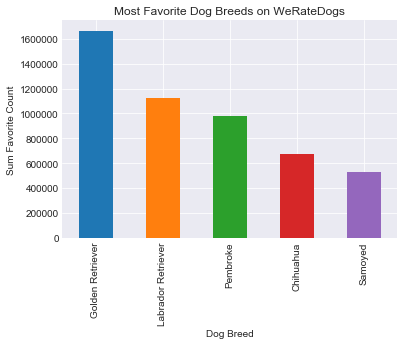

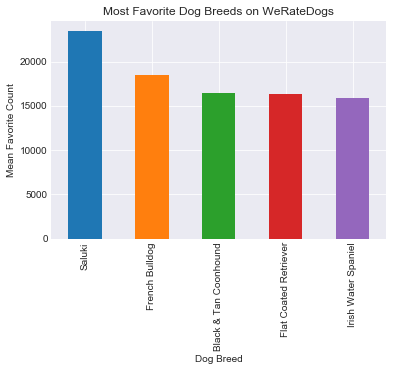

In [1672]:
#https://stackoverflow.com/questions/11244514/modify-tick-label-text

fig, ax = plt.subplots()

labels = ['Golden Retriever', 'Labrador Retriever', 'Pembroke', 'Chihuahua', 'Samoyed']
df[df['p1_dog']==True].groupby(df['p1'])['favorite_count'].sum().sort_values(ascending=False)[0:5].plot(kind='bar')
plt.xlabel('Dog Breed')
ax.set_xticklabels(labels)
plt.ylabel('Sum Favorite Count')
plt.title('Most Favorite Dog Breeds on WeRateDogs');

fig, ax = plt.subplots()

labels2 = ['Saluki', 'French Bulldog', 'Black & Tan Coonhound', 'Flat Coated Retriever', 'Irish Water Spaniel']
df[df['p1_dog']==True].groupby(df['p1'])['favorite_count'].mean().sort_values(ascending=False)[0:5].plot(kind='bar')
plt.xlabel('Dog Breed')
ax.set_xticklabels(labels2)
plt.ylabel('Mean Favorite Count')
plt.title('Most Favorite Dog Breeds on WeRateDogs');




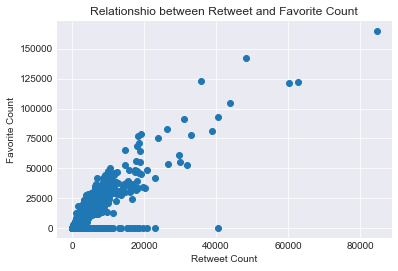

In [1643]:
plt.scatter(df['retweet_count'], df['favorite_count'])
plt.xlabel('Retweet Count')
plt.ylabel('Favorite Count')
plt.title('Relationshio between Retweet and Favorite Count');

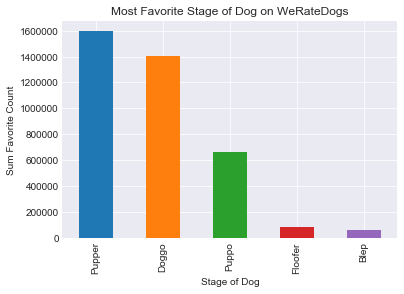

In [1644]:
labels = ['Pupper', 'Doggo', 'Puppo', 'Floofer', 'Blep']
fig, ax = plt.subplots()
df.groupby(['stage_of_dog']).favorite_count.sum().sort_values(ascending=False).plot(kind='bar')

plt.xlabel('Stage of Dog')
ax.set_xticklabels(labels)
plt.ylabel('Sum Favorite Count')
plt.title('Most Favorite Stage of Dog on WeRateDogs');


In [1645]:
df['ratio'] = df['numerator'] / df['denominator']

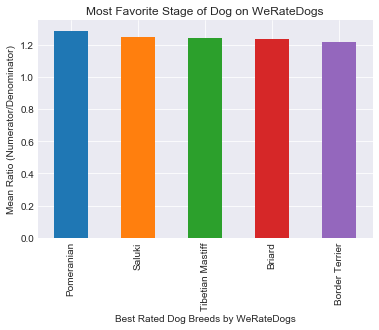

In [1653]:
labels = ['Pomeranian', 'Saluki', 'Tibetian Mastiff', 'Briard', 'Border Terrier']
fig, ax = plt.subplots()

df[df['p1_dog']==True].groupby(df['p1'])['ratio'].mean().sort_values(ascending=False)[0:5].plot(kind='bar')

plt.xlabel('Best Rated Dog Breeds by WeRateDogs')
ax.set_xticklabels(labels)
plt.ylabel('Mean Ratio (Numerator/Denominator)')
plt.title('Most Favorite Stage of Dog on WeRateDogs');

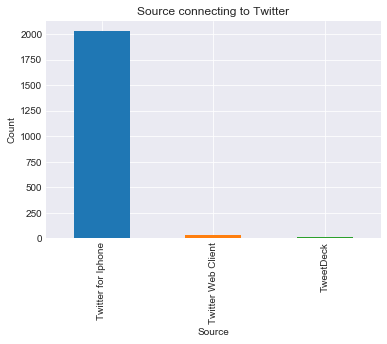

In [1671]:
fig, ax = plt.subplots()
df['source'].value_counts().plot(kind='bar')
plt.xlabel('Source')
plt.ylabel('Count')
plt.title('Source connecting to Twitter');